In [1]:
%load_ext autoreload
%autoreload 2

In [9]:
import re
import numpy as np
import torch
from diffusers import StableDiffusionGLIGENPipeline
from diffusers.utils import load_image
from PIL import Image, ImageDraw, ImageFont
import dataset
from dataset import COCOPanopticDataset
import pickle as pkl
from torchvision.transforms.functional import to_tensor, to_pil_image
from pathlib import Path

from gligen.drawlib import *
from gligen.utils import *

In [10]:

# Generate an image described by the prompt and
# insert objects described by text at the region defined by bounding boxes
pipe = StableDiffusionGLIGENPipeline.from_pretrained(
    "masterful/gligen-1-4-generation-text-box", variant="fp16", torch_dtype=torch.float16, safety_checker=None,
)
pipe = pipe.to("cuda")


text_encoder/model.fp16.safetensors not found


Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

/USERSPACE/lukovdg1/venvs/densediffusion/lib/python3.9/site-packages/transformers/models/clip/feature_extraction_clip.py:28: FutureWarning: The class CLIPFeatureExtractor is deprecated and will be removed in version 5 of Transformers. Please use CLIPImageProcessor instead.
  warnings.warn(
You have disabled the safety checker for <class 'diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion_gligen.StableDiffusionGLIGENPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


a highly detailed photorealistic image of a gold coin, a blue crystal ball and a red tennis ball on a wooden table.
[(0.30078125, 0.119140625, 0.4375, 0.26171875), (0.189453125, 0.400390625, 0.71875, 0.9453125), (0.587890625, 0.03515625, 0.921875, 0.380859375), (0.0, 0.0, 0.998046875, 0.998046875)]
['a gold coin', 'a blue crystal ball', 'a red tennis ball', 'a wooden table']


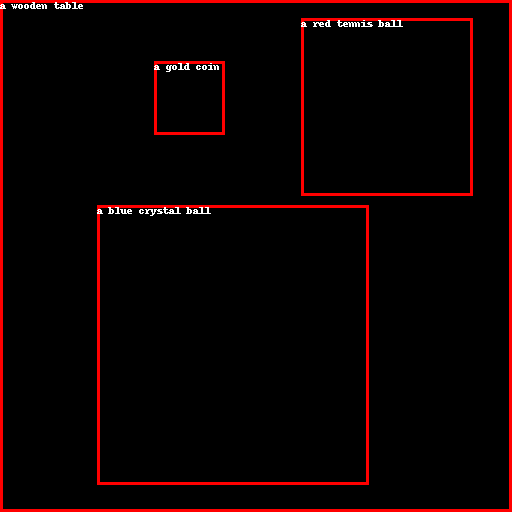

  0%|          | 0/50 [00:00<?, ?it/s]

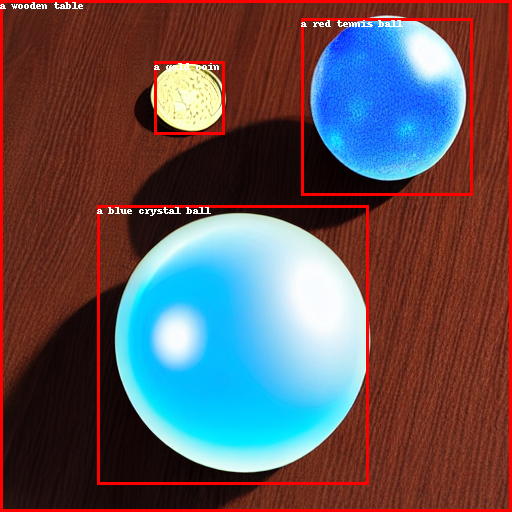

In [12]:
with open("/USERSPACE/lukovdg1/controlnet11/evaldata/extradev.pkl", "rb") as f:
    loadedexamples = pkl.load(f)
example = loadedexamples[0]
img = example.load_image()

caption, bboxes, prompts = process_example_for_gligen(example)
print(caption)
print(bboxes)
print(prompts)
display(display_bboxes(bboxes, prompts))

gen_image = pipe(
    prompt=caption,
    gligen_phrases=prompts,
    gligen_boxes=bboxes,
    gligen_scheduled_sampling_beta=1.,    # this is actually \tau from the paper
    output_type="pil",
    num_inference_steps=50,
).images[0]
display(display_bboxes(bboxes, prompts, _img=gen_image))

In [44]:
#

In [45]:
seed_everything(123456)

In [46]:
paths = [
    "/USERSPACE/lukovdg1/controlnet11/evaldata/extradev.pkl",
    "/USERSPACE/lukovdg1/controlnet11/evaldata/threeorange1.pkl",
    "/USERSPACE/lukovdg1/controlnet11/evaldata/threeballs1.pkl",
    "/USERSPACE/lukovdg1/controlnet11/evaldata/threecoloredballs1.pkl",
    "/USERSPACE/lukovdg1/controlnet11/evaldata/threesimplefruits1.pkl",
    "/USERSPACE/lukovdg1/controlnet11/evaldata/openair1.pkl",
    "/USERSPACE/lukovdg1/controlnet11/evaldata/foursquares2.pkl",
]

outpath = Path("gligen_outputs")
i = 1

for path in [Path(p) for p in paths]:
    print(f"Doing path: {path}")
    resultpath = None
    while resultpath is None or resultpath.exists():
        resultpath = outpath / (path.stem + f"_{i}_out")
        i += 1
        
    resultpath.mkdir(parents=True, exist_ok=True)

    with open(path, "rb") as f:
        inpexamples = pkl.load(f)

    allout = []
    for j, inpexample in enumerate(inpexamples):
        outputs = run_example(inpexample)
        allout.append(outputs)
        imgs = [output["image"] for output in outputs]
        draw = DrawRow(*[DrawImage(img) for img in imgs])
        draw.drawself().save(resultpath / f"{j}.png")
        with open(resultpath / f"{j}.inputs.json", "w") as ff:
            json.dump(process_example_for_gligen(inpexample), ff, indent=4)
        # display(draw.drawself())
        break
    break
    
    print(path, path.stem, (outpath / path.stem / f"{i}").exists())

Doing path: /USERSPACE/lukovdg1/controlnet11/evaldata/extradev.pkl


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

In [155]:
rets = run_example(example)

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

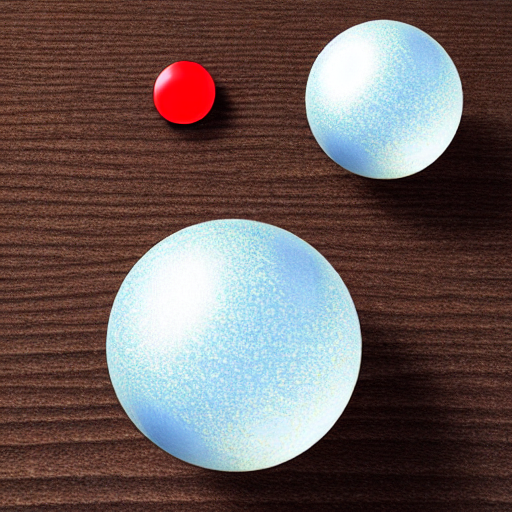

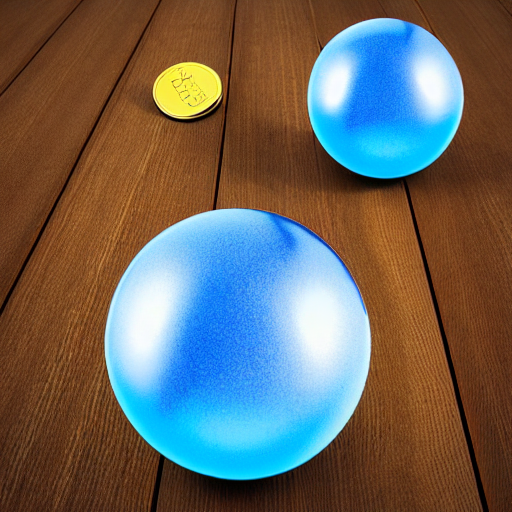

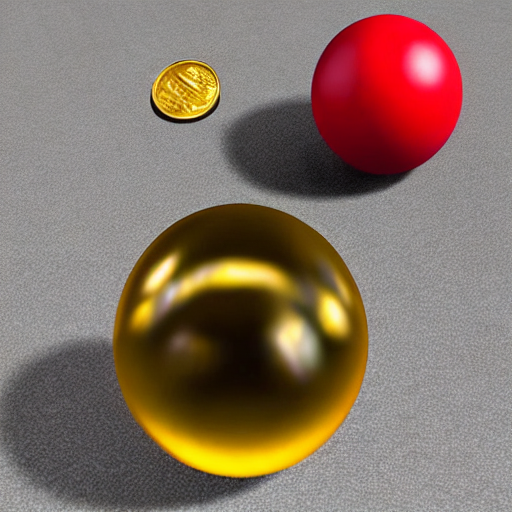

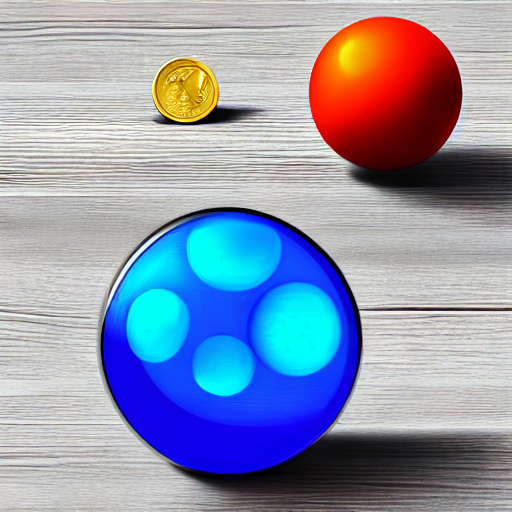

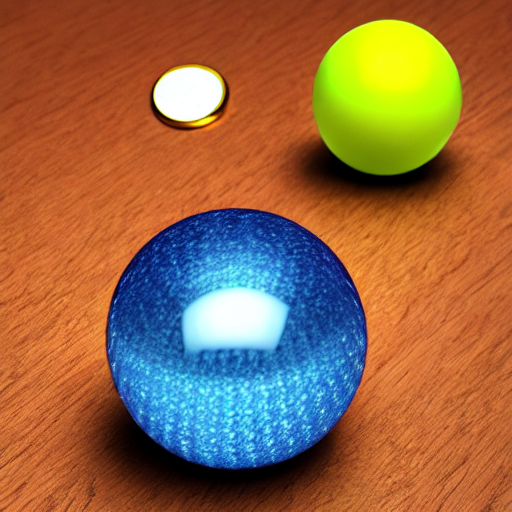

In [156]:
for ret in rets:
    display(ret["image"])

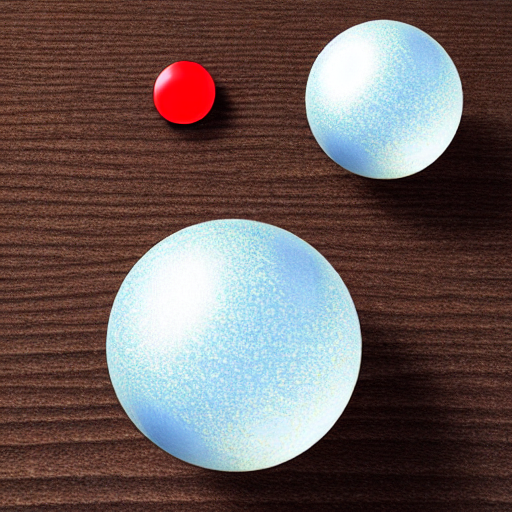

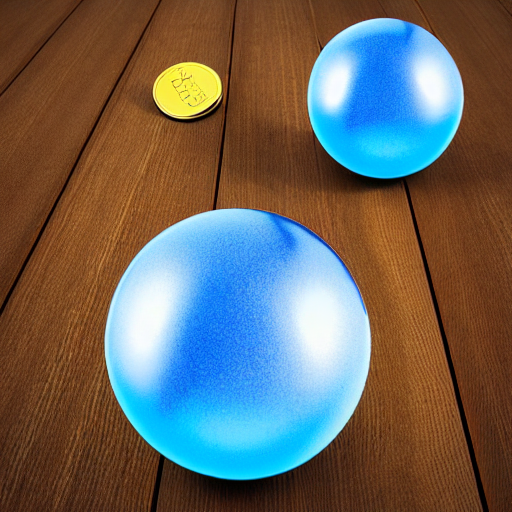

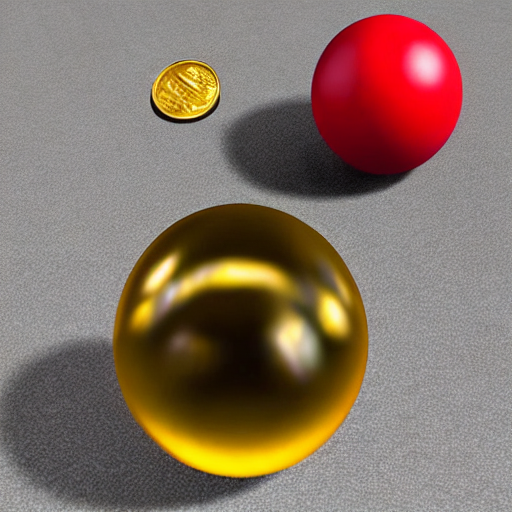

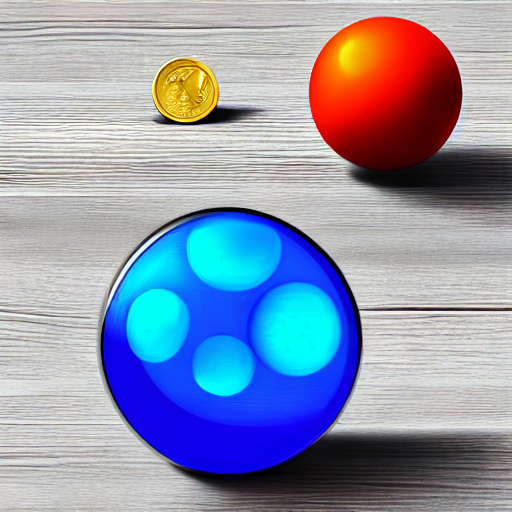

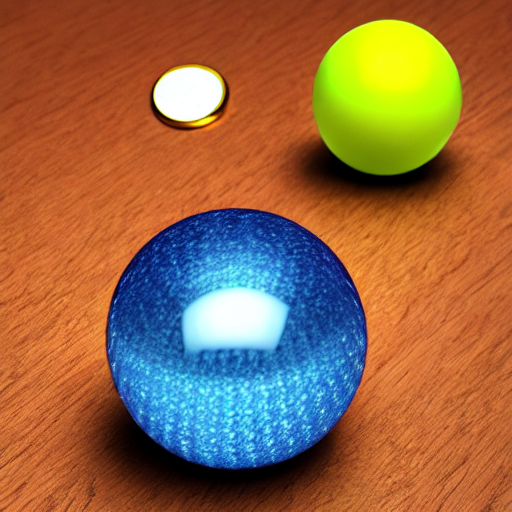

In [153]:
for ret in rets:
    display(ret["image"])

In [22]:
saved = pkl.load(open("/USERSPACE/lukovdg1/DenseDiffusion/gligen_outputs/threeorange1_3_out/outbatches.pkl", "rb"))

FileNotFoundError: [Errno 2] No such file or directory: '/USERSPACE/lukovdg1/DenseDiffusion/gligen_outputs/threeorange1_3_out/outbatches.pkl'

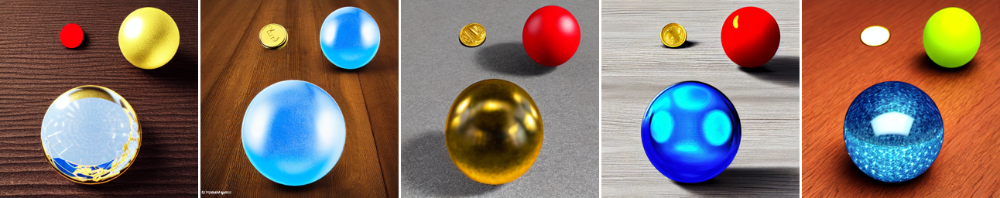

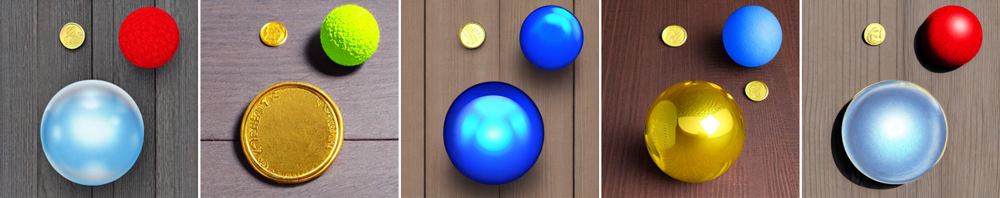

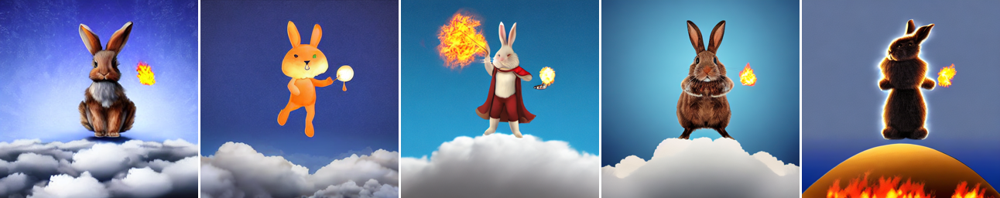

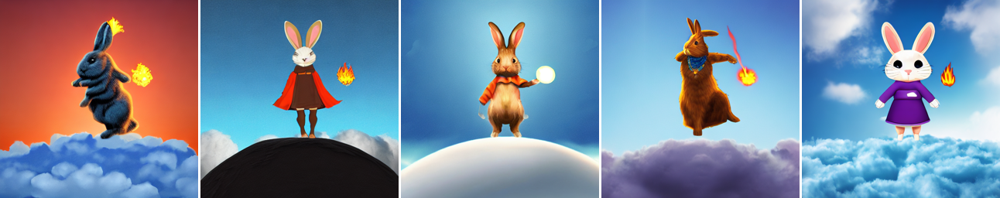

In [23]:
for batch in saved:
    imgs = DrawRow(*[DrawImage(img["image"]) for img in batch])
    display(imgs.drawself())
    


In [7]:

prompt = "a waterfall and a modern high speed train running through the tunnel in a beautiful forest with fall foliage"
boxes = [[0.1387, 0.2051, 0.4277, 0.7090], [0.4980, 0.4355, 0.8516, 0.7266]]
phrases = ["a waterfall", "a modern high speed train running through the tunnel"]

images = pipe(
    prompt=prompt,
    gligen_phrases=phrases,
    gligen_boxes=boxes,
    gligen_scheduled_sampling_beta=1,
    output_type="pil",
    num_inference_steps=50,
).images



  0%|          | 0/50 [00:00<?, ?it/s]

(512, 512)


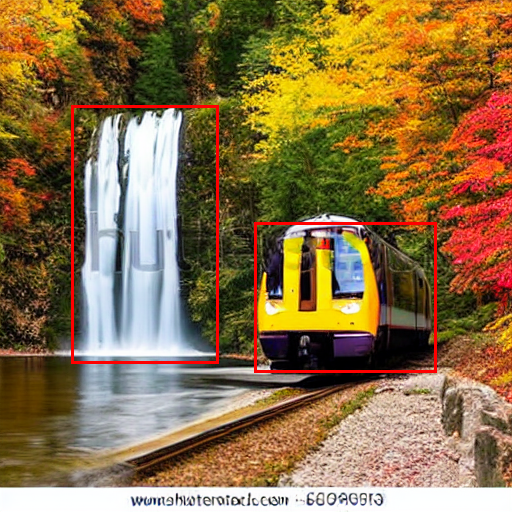

In [6]:
image = images[0]
print(image.size)
imdraw = ImageDraw.Draw(image)
for box in boxes:
    imdraw.rectangle([(box[0] * image.size[0], box[1] * image.size[1]), (box[2] * image.size[0], box[3] * image.size[1])], outline=(255, 0, 0), width=3)
display(image)


In [54]:

prompt = "a gold coin, a blue crystal ball and a red tennis ball on a wooden table"
boxes = [[0.2, 0.1, 0.35, 0.25], [0.25, 0.4, 0.8, 0.95], [0.6, 0.1, 0.9, 0.4], [0, 0, 1, 1]]
phrases = ["a gold coin", "a blue crystal ball", "a red tennis ball", "a wooden table"]


prompt = "an apricot, a pumpkin and an orange on a wooden table"
boxes = [[0.2, 0.1, 0.35, 0.25], [0.25, 0.4, 0.8, 0.95], [0.6, 0.1, 0.9, 0.4], [0, 0, 1, 1]]
phrases = ["an apricot", "a pumpkin", "an orange", "a wooden table"]

images = pipe(
    prompt=prompt,
    gligen_phrases=phrases,
    gligen_boxes=boxes,
    gligen_scheduled_sampling_beta=1,
    output_type="pil",
    num_inference_steps=50,
).images



  0%|          | 0/50 [00:00<?, ?it/s]

(512, 512)


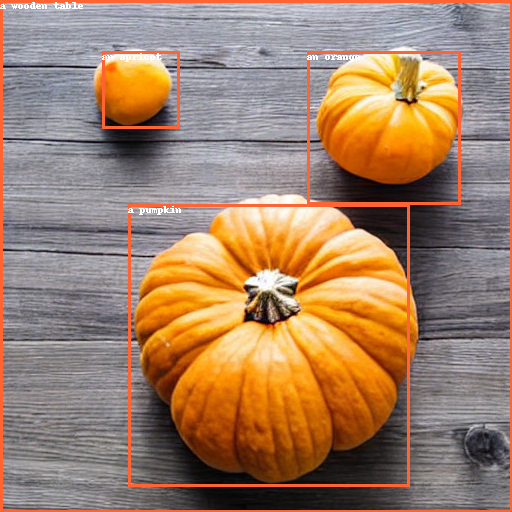

In [55]:
image = images[0]
print(image.size)
imdraw = ImageDraw.Draw(image)
for phrase, box in zip(phrases, boxes):
    topleft = (box[0] * image.size[0], box[1] * image.size[1])
    bottomright = (box[2] * image.size[0], box[3] * image.size[1])
    imdraw.rectangle([topleft, bottomright], outline=(255, 100, 50), width=3)
    imdraw.text(topleft, phrase, font_size=32)
display(image)
